# Run a trained model on images and show results

In [1]:
import sys
sys.path.append("../src")

In [2]:
import os
import json

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import sklearn
from sklearn.metrics import confusion_matrix
import seaborn as sns
from matplotlib.colors import LogNorm

from slim_models.nets import resnet_v1, inception_resnet_v2, nasnet
from slim_models.preprocessing import vgg_preprocessing, inception_preprocessing
from models import model_fn
from tools.utils import ImageDecoder

%matplotlib inline

/home/ubuntu/.pyenv/versions/3.6.2/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [27]:
id_to_class_name = {
    0: "non", 
    1: "re"
}

In [11]:
val_metadata_filepath = "/home/ubuntu/Data/dataset/recycle/data/interim/non_dup_v1_binary/recycle-val_metadata.json"
with open(val_metadata_filepath, "rt") as f:
    val_metadata = json.loads(f.read())
    
samples_per_class = val_metadata["samples_per_class"]

In [4]:
def input_fn(filepaths, visualize=False, network_name="resnet_v1_101"):
    dataset = tf.data.Dataset.from_tensor_slices(filepaths)
    
    def read_file(filepath):
        image_str = tf.read_file(filepath)
        image_decoded = tf.image.decode_image(image_str, channels=3)
        return image_decoded
    
    def preprocess(image):
        if network_name == "resnet_v1_101":
            image_size = resnet_v1.resnet_v1_101.default_image_size
            image = vgg_preprocessing.preprocess_image(image, image_size,
                                                       image_size, is_training=False)
            if visualize:
                image = vgg_preprocessing._mean_image_subtraction(
                    image, [-vgg_preprocessing._R_MEAN, 
                            -vgg_preprocessing._G_MEAN, 
                            -vgg_preprocessing._B_MEAN])
        else:
            image_size = nasnet.nasnet.build_nasnet_large.default_image_size
            image = inception_preprocessing.preprocess_image(image, image_size,
                                                             image_size, is_training=False)
            if visualize:
                image = (image / 2.0 + 0.5) * 255
            
        image = tf.expand_dims(image, 0)
        return image
        
    dataset = dataset.map(read_file)
    dataset = dataset.map(preprocess)
    iterator = dataset.make_one_shot_iterator()
    features = {
        "image": iterator.get_next()
    }
    labels = tf.constant(1)
    return features, labels

In [5]:
model_dir = "../logs/BIN00/"
params = {
    "num_classes": 2,
    "network_name": "nasnet_large"
}
estimator = tf.estimator.Estimator(model_fn, model_dir=model_dir, params=params)

INFO:tensorflow:Using default config.


INFO:tensorflow:Using default config.


INFO:tensorflow:Using config: {'_model_dir': '../logs/BIN00/', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f2aeee37240>, '_task_type': 'worker', '_task_id': 0, '_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


INFO:tensorflow:Using config: {'_model_dir': '../logs/BIN00/', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f2aeee37240>, '_task_type': 'worker', '_task_id': 0, '_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [6]:
predict_filepaths = [
#     "/home/ubuntu/github/ai/recycle/data/raw/merged_v2/split/val/re_05_Bottle/empty_plastic_bottles_000186.jpg",
#     "/home/ubuntu/Downloads/20171204_155411.jpg",
#     "/home/ubuntu/Downloads/20171204_161156.jpg",
#     "/home/ubuntu/Downloads/20171204_161457.jpg",
#     "/home/ubuntu/Downloads/20171204_161643.jpg",
    "/home/ubuntu/Pictures/recycle/test_images/24.jpg"
]

predict_filepaths = "/home/ubuntu/Dropbox/Work/images"
# predict_filepaths = "/home/ubuntu/github/ai/recycle/data/raw/merged_v2/split/val/re_08_Drink_boxes_+_Beverage_cartons_+_Aseptic_packaging"

In [7]:
if isinstance(predict_filepaths, str):
    folder = predict_filepaths
    predict_filepaths = []
    for dirpath, dirnames, filenames in os.walk(folder):
        for filename in filenames:
            predict_filepaths.append(os.path.join(dirpath, filename))
            
    predict_filepaths = sorted(predict_filepaths)
predict_filepaths

['/home/ubuntu/Dropbox/Work/images/20171204_162521.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162524.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162530.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162532.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162539.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162543.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162549.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_162558.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_203713.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171204_203833.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171208_175920.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171211_111150(1).jpg',
 '/home/ubuntu/Dropbox/Work/images/20171211_111150.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171211_111151.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171211_111153.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171211_111154.jpg',
 '/home/ubuntu/Dropbox/Work/images/20171213_162322.jpg',
 '/home/ubuntu/Dropbox/Work/

In [34]:
exp_predictions = []
for i, pred in enumerate(estimator.predict(
        input_fn=lambda: input_fn(predict_filepaths, network_name=params["network_name"]))):
    class_id = pred['class_id'][0]
    prob = pred['probs'][0]
    exp_predictions.append((id_to_class_name[class_id], str(prob[class_id])))


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:A GPU is available on the machine, consider using NCHW data format for increased speed on GPU.


INFO:tensorflow:A GPU is available on the machine, consider using NCHW data format for increased speed on GPU.


INFO:tensorflow:Restoring parameters from ../logs/BIN00/model.ckpt-14190


INFO:tensorflow:Restoring parameters from ../logs/BIN00/model.ckpt-14190


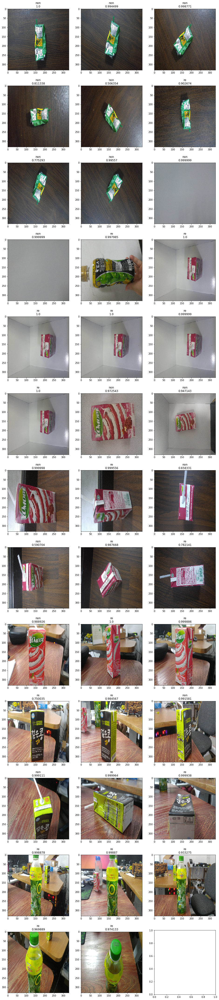

In [35]:
ncols = 3
nrows = len(predict_filepaths) // ncols + 1
fig, axs = plt.subplots(nrows, ncols,
                        figsize=(16, 6 * nrows), squeeze=False)

f, l = input_fn(predict_filepaths, visualize=True, network_name=params["network_name"])
with tf.Session() as sess:
    try:
        for i, filepath in enumerate(predict_filepaths):
            a, b = sess.run([f, l])
            img = a["image"][0].astype(np.uint8)
            axs[i // ncols][i % ncols].imshow(img)
            axs[i // ncols][i % ncols].set_title(
                exp_predictions[i][0] + "\n" + str(exp_predictions[i][1]))
    except Exception as e:
        print(e)


# Confusion matrix of trained model on validation data

In [15]:
def input_fn_from_tfrecords(file_patterns, batch_size, 
                            visualize=False, network_name="resnet_v1_101"):
    """Input function for Resnet Estimator."""
    filenames = []
    for pattern in file_patterns.split(","):
        filenames.extend(tf.gfile.Glob(pattern))

    def parser(record):
        """Parse tf.Example protobuf."""
        keys_to_features = {
            "image/data": tf.FixedLenFeature((), tf.string),
            "label": tf.FixedLenFeature((), tf.int64)
        }
        parsed = tf.parse_single_example(record, features=keys_to_features)

        image = tf.image.decode_image(parsed["image/data"], channels=3)
        label = parsed["label"]

        return image, label
    
    def preprocess(image, label):
        if network_name == "resnet_v1_101":
            image_size = resnet_v1.resnet_v1_101.default_image_size
            image = vgg_preprocessing.preprocess_image(image, image_size,
                                                       image_size, is_training=False)
            if visualize:
                image = vgg_preprocessing._mean_image_subtraction(
                    image, [-vgg_preprocessing._R_MEAN, 
                            -vgg_preprocessing._G_MEAN, 
                            -vgg_preprocessing._B_MEAN])
        else:
            image_size = inception_resnet_v2.inception_resnet_v2.default_image_size
            image = inception_preprocessing.preprocess_image(image, image_size,
                                                             image_size, is_training=False)
            if visualize:
                image = (image / 2.0 + 0.5) * 255
            
        label = tf.to_int32(label)
        return {"image": image}, label

    with tf.device('/cpu:0'):
        # Create the dataset
        dataset = tf.data.TFRecordDataset(filenames, buffer_size=256 * 2 ** 20)
        dataset = dataset.map(parser, num_parallel_calls=batch_size * 10)
        dataset = dataset.map(preprocess,
                              num_parallel_calls=batch_size * 10)
        dataset = dataset.batch(batch_size=batch_size)
        dataset = dataset.prefetch(batch_size)

        # Create iterator for the dataset
        iterator = dataset.make_one_shot_iterator()
        features, labels = iterator.get_next()

    return features, labels

In [16]:
model_dir = "../logs/BIN00/"
params = {
    "num_classes": 2,
    "network_name": "nasnet_large"
}
estimator = tf.estimator.Estimator(model_fn, model_dir=model_dir, params=params)

INFO:tensorflow:Using default config.


INFO:tensorflow:Using default config.


INFO:tensorflow:Using config: {'_model_dir': '../logs/BIN00/', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f2aceb837f0>, '_task_type': 'worker', '_task_id': 0, '_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


INFO:tensorflow:Using config: {'_model_dir': '../logs/BIN00/', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f2aceb837f0>, '_task_type': 'worker', '_task_id': 0, '_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [17]:
batch_size = 64
file_patterns = "/home/ubuntu/Data/dataset/recycle/data/interim/non_dup_v1_binary/recycle-val-*"
predictions = None
probs = None
for i, pred in enumerate(estimator.predict(
        input_fn=lambda: input_fn_from_tfrecords(file_patterns, batch_size, network_name="nasnet_large"))):
    class_ids = pred['class_id']
    p = pred["probs"][np.arange(len(class_ids)), class_ids]
    if predictions is None:
        predictions = class_ids
        probs = p
    else:
        predictions = np.hstack((predictions, class_ids))
        probs = np.hstack((probs, p))

INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:A GPU is available on the machine, consider using NCHW data format for increased speed on GPU.


INFO:tensorflow:A GPU is available on the machine, consider using NCHW data format for increased speed on GPU.


INFO:tensorflow:Restoring parameters from ../logs/BIN00/model.ckpt-14190


INFO:tensorflow:Restoring parameters from ../logs/BIN00/model.ckpt-14190


In [18]:
f, l = input_fn_from_tfrecords(file_patterns, batch_size, visualize=True)
images = None
labels = None
with tf.Session() as sess:
    try:
        while True:
            a, b = sess.run([f, l])
            if labels is None:
                labels = b
                images = a["image"]
            else:
                labels = np.hstack((labels, b))
                images = np.concatenate((images, a["image"]))
    except Exception as e:
        pass
    
images = images.astype(np.uint8)
print("Accuracy on validation set:", np.mean(predictions == labels))

Accuracy on validation set: 0.824199288256


Text(184.92,0.5,'Label')

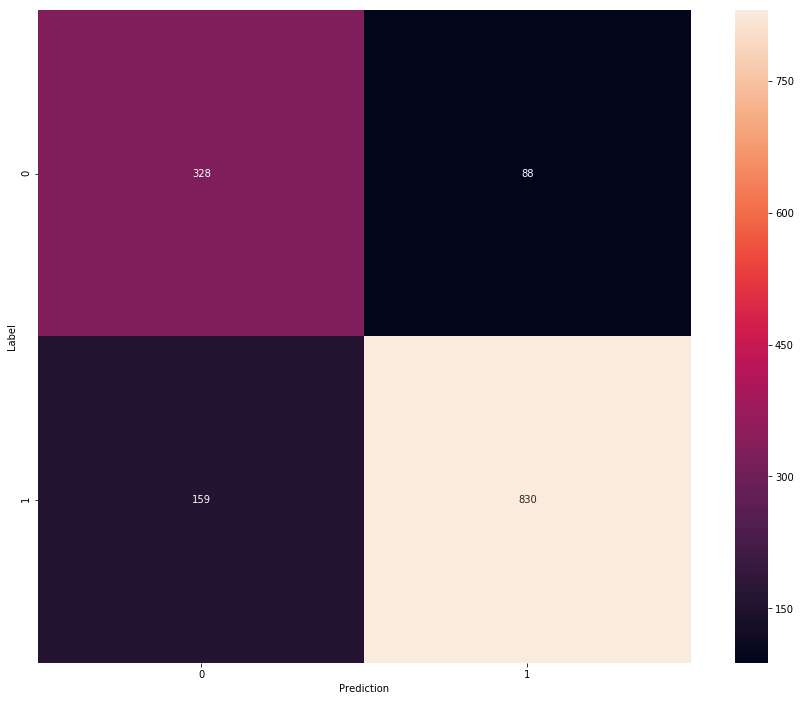

In [19]:
cm = confusion_matrix(labels, predictions)
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt="d", square=True)
plt.xlabel("Prediction")
plt.ylabel("Label")

# Per-class accuracy

In [20]:
row_sum = np.sum(cm, axis=1)
per_class_acc = np.diag(cm) / row_sum
print("Mean per-class accuracy:", np.mean(per_class_acc))

Mean per-class accuracy: 0.813846542739


In [21]:
sorted_idxs = [t[0] for t in sorted(enumerate(per_class_acc), key=lambda x: x[1])]
for idx in sorted_idxs:
    print("{:2d} {:41}: {:.6f} {:3d}".format(idx, id_to_class_name[idx][:40], 
                                       per_class_acc[idx], samples_per_class[idx]))

 0 non_10_Food                              : 0.788462 416
 1 re_20_Plastic_jar                        : 0.839232 989


Text(0,0.5,'Accuracy')

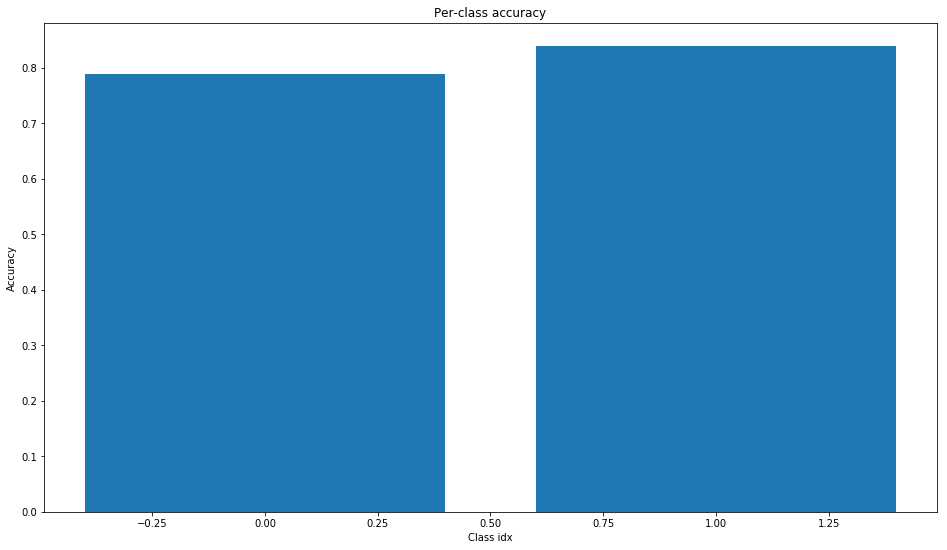

In [22]:
plt.figure(figsize=(16, 9))
plt.bar(range(len(per_class_acc)), sorted(per_class_acc))
plt.title("Per-class accuracy")
plt.xlabel("Class idx")
plt.ylabel("Accuracy")

Text(184.92,0.5,'Label')

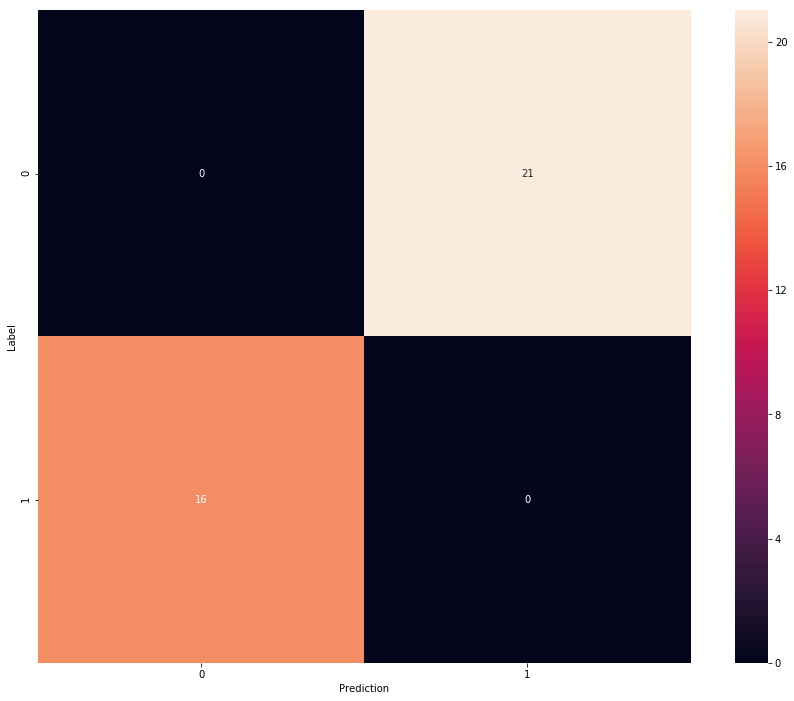

In [23]:
wrong_percentage = cm / row_sum.reshape((-1, 1))
np.fill_diagonal(wrong_percentage, 0)
plt.figure(figsize=(16, 12))
sns.heatmap((100 * wrong_percentage).astype(np.int32), annot=True, fmt="d", square=True)
plt.xlabel("Prediction")
plt.ylabel("Label")

# Examples of wrong predictions

In [24]:
def wrong_predictions(predictions, labels, probs, filter_labels=None):
    idxs = np.argsort(probs)[::-1]
    for idx in idxs:
        if labels[idx] != predictions[idx] and \
                (filter_labels is None or labels[idx] == filter_labels):
            yield idx

In [31]:
wrong_idxs = list(wrong_predictions(predictions, labels, probs, filter_labels=0))

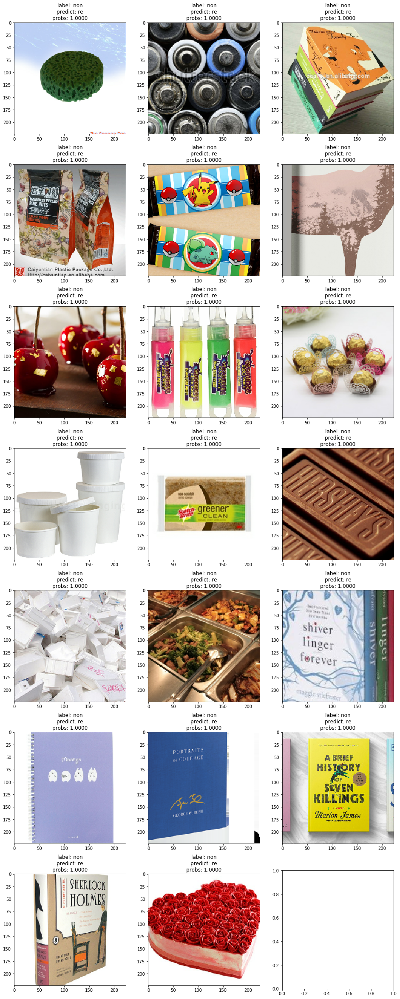

In [32]:
num_images = min(len(wrong_idxs), 20)
ncols = 3
nrows = num_images // ncols + 1
fig, axs = plt.subplots(nrows, ncols,
                        figsize=(16, 6 * nrows), squeeze=False)

for i, idx in enumerate(wrong_idxs[:num_images]):
    axs[i // ncols][i % ncols].imshow(images[idx])
    axs[i // ncols][i % ncols].set_title("label: {}\npredict: {}\nprobs: {:.4f}".format(
        id_to_class_name[labels[idx]], id_to_class_name[predictions[idx]], probs[idx]))

# ROC

In [29]:
conf = probs.copy()
conf[predictions == 0] = 1 - conf[predictions == 0]
idxs = np.argsort(conf)[::-1]

tp = 0
fp = 0
fn = np.sum(labels == 1)
tn = np.sum(labels == 0)
tpr, fpr, acc = [], [], []

for k, i in enumerate(idxs):
    if labels[i]:
        tp += 1
        fn -= 1
    else:
        fp += 1
        tn -= 1
    tpr.append(tp / (tp + fn))
    fpr.append(fp / (fp + tn))
    acc.append((tp + tn) / (tp + tn + fp + fn))
    print(conf[i], tpr[-1], fpr[-1], acc[-1])
        

1.0 0.0010111223458 0.0 0.296797153025
1.0 0.00202224469161 0.0 0.297508896797
1.0 0.00303336703741 0.0 0.298220640569
1.0 0.00404448938322 0.0 0.298932384342
1.0 0.00505561172902 0.0 0.299644128114
1.0 0.00606673407482 0.0 0.300355871886
1.0 0.00606673407482 0.00240384615385 0.299644128114
1.0 0.00707785642063 0.00240384615385 0.300355871886
1.0 0.00808897876643 0.00240384615385 0.301067615658
1.0 0.00910010111223 0.00240384615385 0.301779359431
1.0 0.010111223458 0.00240384615385 0.302491103203
1.0 0.0111223458038 0.00240384615385 0.303202846975
1.0 0.0121334681496 0.00240384615385 0.303914590747
1.0 0.0131445904954 0.00240384615385 0.30462633452
1.0 0.0141557128413 0.00240384615385 0.305338078292
1.0 0.0151668351871 0.00240384615385 0.306049822064
1.0 0.0151668351871 0.00480769230769 0.305338078292
1.0 0.0161779575329 0.00480769230769 0.306049822064
1.0 0.0171890798787 0.00480769230769 0.306761565836
1.0 0.0182002022245 0.00480769230769 0.307473309609
1.0 0.0192113245703 0.004807692

0.994969 0.69868554095 0.110576923077 0.755160142349
0.994862 0.699696663296 0.110576923077 0.755871886121
0.99486 0.700707785642 0.110576923077 0.756583629893
0.994834 0.701718907988 0.110576923077 0.757295373665
0.994587 0.702730030334 0.110576923077 0.758007117438
0.994503 0.703741152679 0.110576923077 0.75871886121
0.994192 0.704752275025 0.110576923077 0.759430604982
0.993447 0.705763397371 0.110576923077 0.760142348754
0.993318 0.706774519717 0.110576923077 0.760854092527
0.993277 0.707785642063 0.110576923077 0.761565836299
0.992923 0.708796764408 0.110576923077 0.762277580071
0.992843 0.709807886754 0.110576923077 0.762989323843
0.992714 0.7108190091 0.110576923077 0.763701067616
0.992395 0.711830131446 0.110576923077 0.764412811388
0.992246 0.712841253792 0.110576923077 0.76512455516
0.992036 0.713852376138 0.110576923077 0.765836298932
0.991939 0.714863498483 0.110576923077 0.766548042705
0.991795 0.714863498483 0.112980769231 0.765836298932
0.991517 0.715874620829 0.11298076

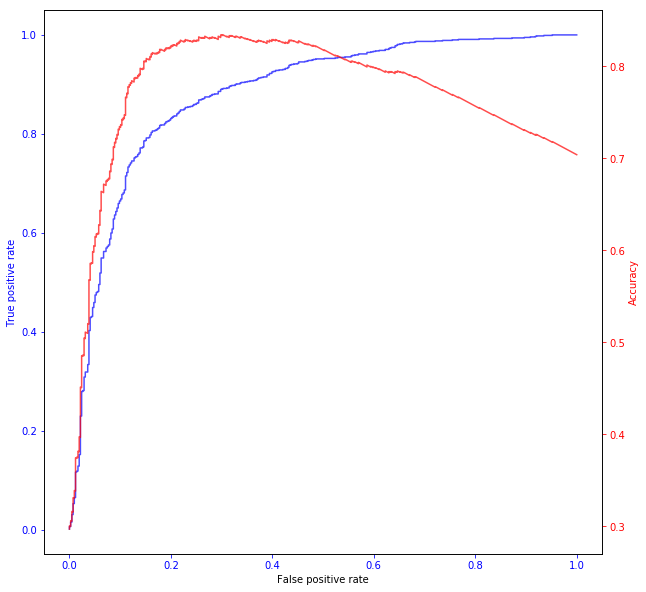

In [30]:
fig, ax1 = plt.subplots(figsize=(10, 10))
ax1.plot(fpr, tpr, 'b-', alpha=0.7)
ax1.set_xlabel("False positive rate")
ax1.set_ylabel("True positive rate", color='b')
ax1.tick_params(colors='b')

ax2 = ax1.twinx()
ax2.plot(fpr, acc, 'r-', alpha=0.7)
ax2.set_ylabel('Accuracy', color='r')
ax2.tick_params(colors='r')